In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import PIL.Image
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img, img_to_array, array_to_img
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten,LeakyReLU
from tensorflow.keras.layers import Conv2D, MaxPooling2D
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation, Dense, Flatten, BatchNormalization, Conv2D, MaxPool2D,Reshape,Conv2DTranspose
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix
import torch
from torchvision import datasets, transforms
import itertools
import os
import shutil
import random
import glob
import matplotlib.pyplot as plt
import warnings
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Reshape
from keras.layers import Flatten
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Dropout
from keras.utils.vis_utils import plot_model
from numpy import expand_dims
from numpy import zeros
from numpy import ones
from numpy import vstack
from numpy.random import randn
from numpy.random import randint
from keras.datasets.mnist import load_data
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Reshape
from keras.layers import Flatten
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Dropout
from matplotlib import pyplot
import zipfile

with zipfile.ZipFile("/kaggle/input/all-dogs.zip","r") as zip_ref:
    zip_ref.extractall("/kaggle/working/")
    
with zipfile.ZipFile("/kaggle/input/Annotation.zip","r") as zip_ref:
    zip_ref.extractall("/kaggle/working/")
    
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


Using TensorFlow backend.


# Generative Dog Images


 ## Brief description of the problem and data
 
 The goal of this notebook is to explore the dataset, clean the images, and construct a model that will allow us to generate images of dogs that are based on the dataset. 

setting up the data

In [2]:
unzipper = zipfile.ZipFile('/kaggle/input/Annotation.zip', 'r')
unzipper.extractall('/kaggle/working/')

In [3]:
unzipper = zipfile.ZipFile('/kaggle/input/all-dogs.zip', 'r')
unzipper.extractall('/kaggle/working/')

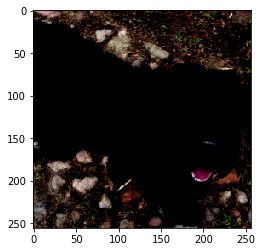

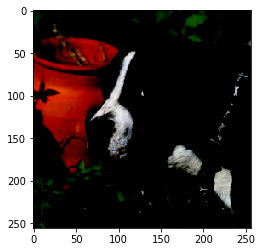

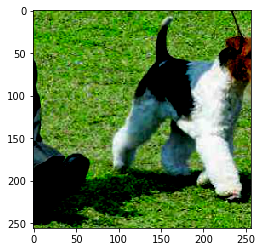

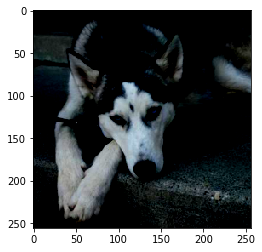

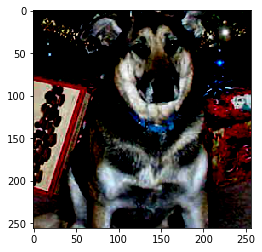

In [4]:

transform = transforms.Compose([transforms.Resize(256),
                                transforms.CenterCrop(256),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
                               ])

train_data = datasets.ImageFolder('/kaggle/working/', transform=transform)

dataloader = torch.utils.data.DataLoader(train_data, shuffle=True,
                                           batch_size=32)

imgs, label = next(iter(dataloader))
imgs = imgs.numpy().transpose(0, 2, 3, 1)

for i in range(5):
    plt.imshow(imgs[i])
    plt.show()

## Generator
The code defines a Generator class in PyTorch that takes a latent vector as input and transforms it into an image. This architecture is commonly used in Generative Adversarial Networks (GANs) as the Generator's role is to learn to generate realistic images from random noise, progressively fooling the Discriminator network during the training process.

In [5]:
class Generator(nn.Module):
    def __init__(self, latent_dim):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(latent_dim, 128),
            nn.ReLU(True),
            nn.Linear(128, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(True),
            nn.Linear(256, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(True),
            nn.Linear(512, 1024),
            nn.BatchNorm1d(1024),
            nn.ReLU(True),
            nn.Linear(1024, 256*256*3),
            nn.Tanh()
        )

    def forward(self, z):
        img = self.model(z)
        img = img.view(img.size(0), 3, 256, 256)
        return img


## Discriminator
This code defines a Discriminator class in PyTorch designed to classify images as real or fake. It takes an image as input, flattens it into a vector, and then passes it through a series of fully connected layers with LeakyReLU activations and Dropout layers. The final output is a single value between 0 and 1, representing the probability that the input image is real.

In [6]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(256*256*3, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),
            nn.Linear(256, 1),
            nn.Sigmoid()
        )

    def forward(self, img):
        img_flat = img.view(img.size(0), -1)
        validity = self.model(img_flat)
        return validity


In [7]:
latent_dim = 100

generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)

optimizer_G = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

adversarial_loss = nn.BCELoss()


Epoch [0/175] | D Loss: 0.4844251573085785 | G Loss: 2.6133503913879395


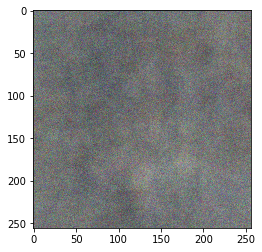

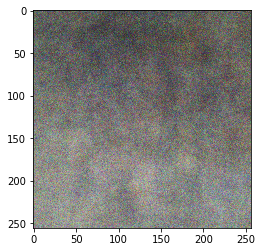

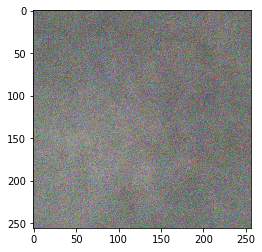

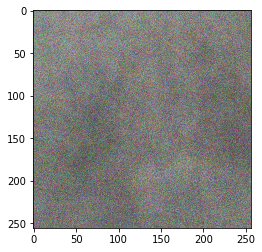

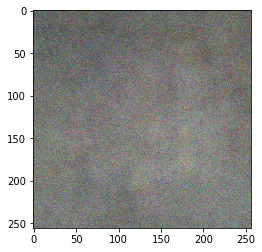

Epoch [1/175] | D Loss: 0.7899812459945679 | G Loss: 2.0285141468048096
Epoch [2/175] | D Loss: 0.5258582234382629 | G Loss: 1.8118934631347656
Epoch [3/175] | D Loss: 1.18392813205719 | G Loss: 1.165479063987732
Epoch [4/175] | D Loss: 0.9753971099853516 | G Loss: 1.7448099851608276
Epoch [5/175] | D Loss: 0.7318662405014038 | G Loss: 1.1609920263290405
Epoch [6/175] | D Loss: 1.431095838546753 | G Loss: 2.1616246700286865
Epoch [7/175] | D Loss: 1.434665322303772 | G Loss: 1.502076506614685
Epoch [8/175] | D Loss: 0.6610729098320007 | G Loss: 1.2075845003128052
Epoch [9/175] | D Loss: 0.6163666844367981 | G Loss: 1.9001827239990234
Epoch [10/175] | D Loss: 0.777336061000824 | G Loss: 1.7652448415756226


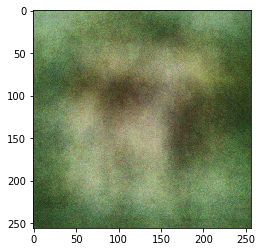

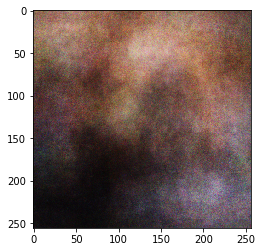

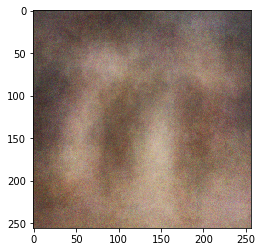

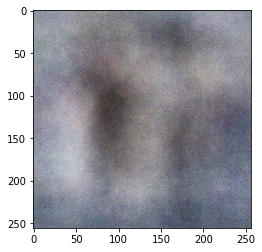

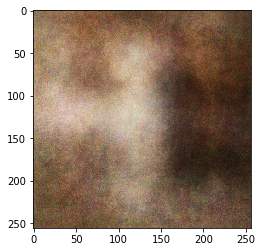

Epoch [11/175] | D Loss: 1.2311475276947021 | G Loss: 1.7229924201965332
Epoch [12/175] | D Loss: 1.0177282094955444 | G Loss: 1.9433164596557617
Epoch [13/175] | D Loss: 1.703212022781372 | G Loss: 2.177668809890747
Epoch [14/175] | D Loss: 0.8405414819717407 | G Loss: 1.929396152496338
Epoch [15/175] | D Loss: 0.947898268699646 | G Loss: 0.9120111465454102
Epoch [16/175] | D Loss: 1.1718909740447998 | G Loss: 1.252905011177063
Epoch [17/175] | D Loss: 1.3131966590881348 | G Loss: 0.9867717623710632
Epoch [18/175] | D Loss: 0.9321659207344055 | G Loss: 1.031519889831543
Epoch [19/175] | D Loss: 1.3753211498260498 | G Loss: 1.3577629327774048
Epoch [20/175] | D Loss: 1.462507724761963 | G Loss: 0.9239625930786133


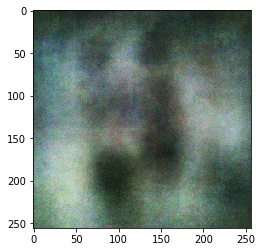

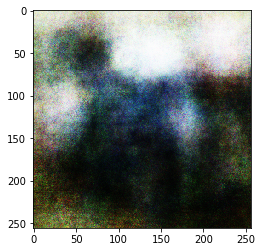

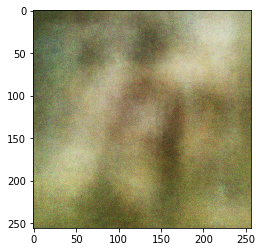

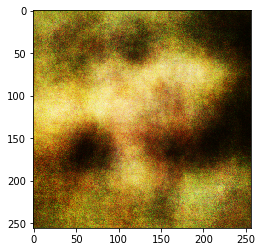

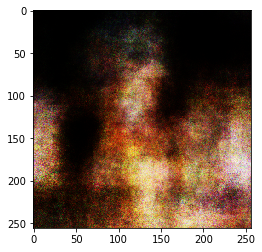

Epoch [21/175] | D Loss: 1.6423406600952148 | G Loss: 0.7480823397636414
Epoch [22/175] | D Loss: 1.8156609535217285 | G Loss: 1.5680838823318481
Epoch [23/175] | D Loss: 1.1678481101989746 | G Loss: 1.1503111124038696
Epoch [24/175] | D Loss: 0.8791617155075073 | G Loss: 1.2072745561599731
Epoch [25/175] | D Loss: 1.0081262588500977 | G Loss: 1.7795528173446655
Epoch [26/175] | D Loss: 1.192924976348877 | G Loss: 1.1774832010269165
Epoch [27/175] | D Loss: 1.7689611911773682 | G Loss: 1.4975709915161133
Epoch [28/175] | D Loss: 1.2104065418243408 | G Loss: 1.376419186592102
Epoch [29/175] | D Loss: 1.3230607509613037 | G Loss: 1.490329384803772
Epoch [30/175] | D Loss: 1.3691773414611816 | G Loss: 1.038912057876587


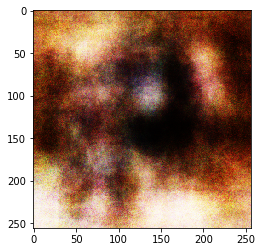

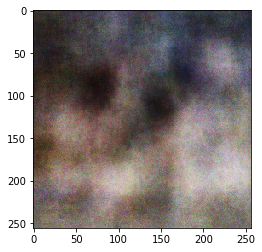

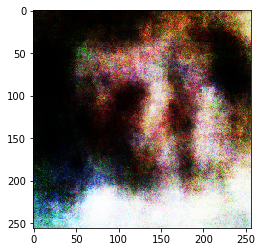

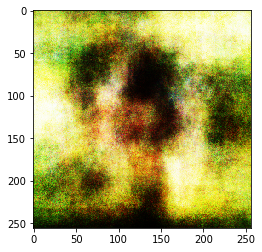

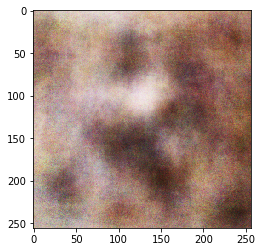

Epoch [31/175] | D Loss: 1.0679973363876343 | G Loss: 1.0493264198303223
Epoch [32/175] | D Loss: 1.533020257949829 | G Loss: 1.53153657913208
Epoch [33/175] | D Loss: 1.5733177661895752 | G Loss: 1.6375808715820312
Epoch [34/175] | D Loss: 1.346106767654419 | G Loss: 1.034732460975647
Epoch [35/175] | D Loss: 0.9627418518066406 | G Loss: 1.1579489707946777
Epoch [36/175] | D Loss: 1.3268663883209229 | G Loss: 0.9965324401855469
Epoch [37/175] | D Loss: 1.0688331127166748 | G Loss: 1.1327577829360962
Epoch [38/175] | D Loss: 1.2164816856384277 | G Loss: 0.9561450481414795
Epoch [39/175] | D Loss: 1.5025135278701782 | G Loss: 0.8740532994270325
Epoch [40/175] | D Loss: 1.3213822841644287 | G Loss: 1.8251146078109741


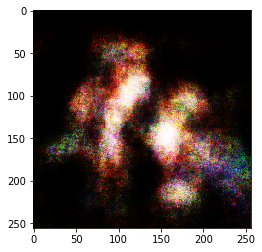

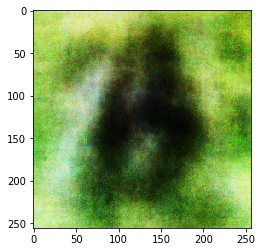

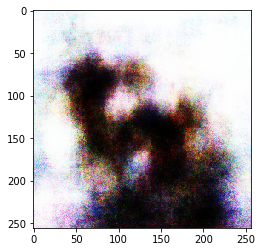

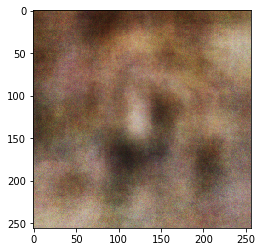

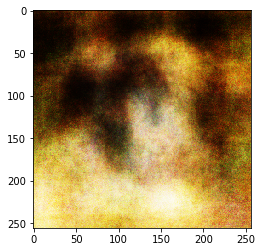

Epoch [41/175] | D Loss: 0.987278938293457 | G Loss: 1.3599408864974976
Epoch [42/175] | D Loss: 1.548551321029663 | G Loss: 1.1814249753952026
Epoch [43/175] | D Loss: 1.3221585750579834 | G Loss: 0.9821707606315613
Epoch [44/175] | D Loss: 1.1098326444625854 | G Loss: 0.7757604122161865
Epoch [45/175] | D Loss: 1.1410331726074219 | G Loss: 0.917914092540741
Epoch [46/175] | D Loss: 1.4677729606628418 | G Loss: 1.225836992263794
Epoch [47/175] | D Loss: 1.1321110725402832 | G Loss: 1.7066000699996948
Epoch [48/175] | D Loss: 1.1262364387512207 | G Loss: 1.5744662284851074
Epoch [49/175] | D Loss: 1.2783129215240479 | G Loss: 0.5075028538703918
Epoch [50/175] | D Loss: 1.2810916900634766 | G Loss: 0.643900454044342


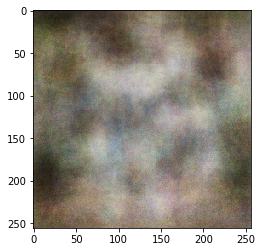

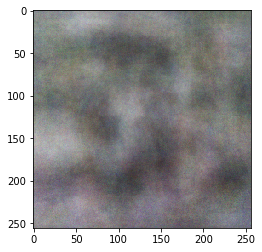

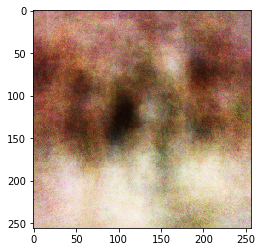

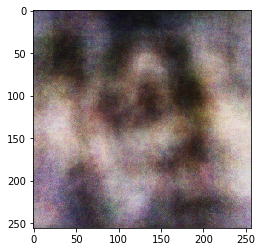

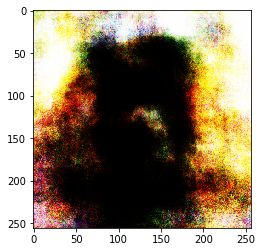

Epoch [51/175] | D Loss: 1.5688860416412354 | G Loss: 1.4749302864074707
Epoch [52/175] | D Loss: 0.896227240562439 | G Loss: 1.5236387252807617
Epoch [53/175] | D Loss: 1.4921305179595947 | G Loss: 0.6606988310813904
Epoch [54/175] | D Loss: 1.036799669265747 | G Loss: 0.7765088081359863
Epoch [55/175] | D Loss: 1.4370946884155273 | G Loss: 1.0244970321655273
Epoch [56/175] | D Loss: 1.2939815521240234 | G Loss: 1.1427229642868042
Epoch [57/175] | D Loss: 1.173163890838623 | G Loss: 1.1820601224899292
Epoch [58/175] | D Loss: 1.4238992929458618 | G Loss: 1.0144487619400024
Epoch [59/175] | D Loss: 1.4366796016693115 | G Loss: 1.2116268873214722
Epoch [60/175] | D Loss: 1.0741419792175293 | G Loss: 1.3382930755615234


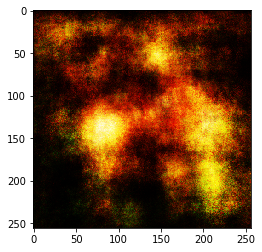

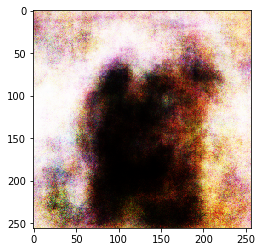

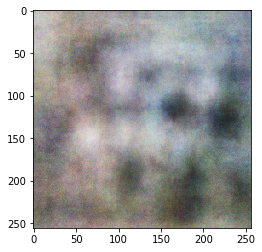

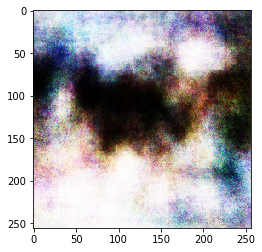

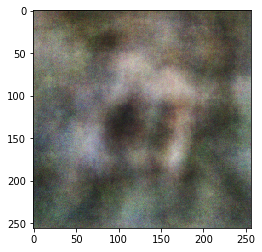

Epoch [61/175] | D Loss: 1.6879174709320068 | G Loss: 0.8454301953315735
Epoch [62/175] | D Loss: 2.4290645122528076 | G Loss: 1.168200135231018
Epoch [63/175] | D Loss: 1.6012372970581055 | G Loss: 1.0640708208084106
Epoch [64/175] | D Loss: 1.5101207494735718 | G Loss: 1.0101687908172607
Epoch [65/175] | D Loss: 1.2700632810592651 | G Loss: 1.3179529905319214
Epoch [66/175] | D Loss: 1.1687121391296387 | G Loss: 0.8599130511283875
Epoch [67/175] | D Loss: 1.1650141477584839 | G Loss: 1.219218373298645
Epoch [68/175] | D Loss: 0.9320913553237915 | G Loss: 1.7183318138122559
Epoch [69/175] | D Loss: 1.6456482410430908 | G Loss: 1.162964940071106
Epoch [70/175] | D Loss: 1.0117433071136475 | G Loss: 0.7629501819610596


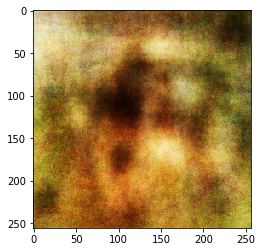

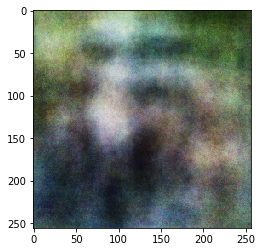

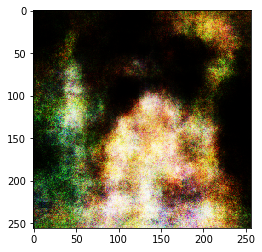

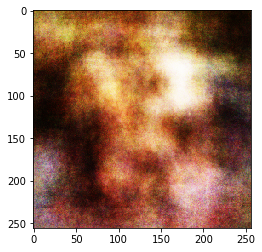

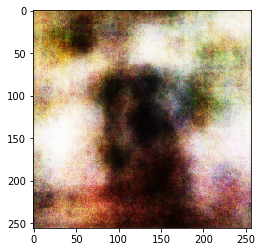

Epoch [71/175] | D Loss: 1.122370719909668 | G Loss: 1.1825772523880005
Epoch [72/175] | D Loss: 1.348937749862671 | G Loss: 1.7214126586914062
Epoch [73/175] | D Loss: 0.9254595637321472 | G Loss: 1.5100988149642944
Epoch [74/175] | D Loss: 1.6516749858856201 | G Loss: 0.6052632331848145
Epoch [75/175] | D Loss: 1.4936131238937378 | G Loss: 0.6137241721153259
Epoch [76/175] | D Loss: 0.9955630302429199 | G Loss: 1.2015317678451538
Epoch [77/175] | D Loss: 1.2662606239318848 | G Loss: 0.8825759887695312
Epoch [78/175] | D Loss: 1.1424038410186768 | G Loss: 0.70427006483078
Epoch [79/175] | D Loss: 1.176340103149414 | G Loss: 1.333459496498108
Epoch [80/175] | D Loss: 1.2665421962738037 | G Loss: 0.8902851939201355


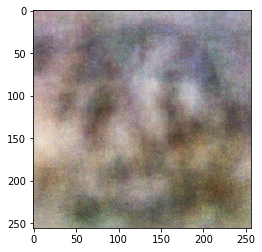

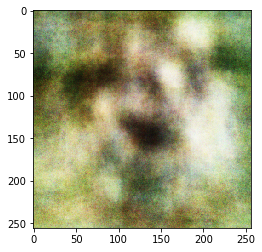

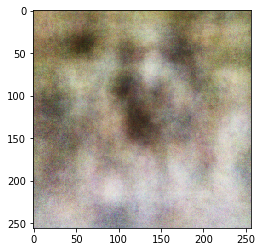

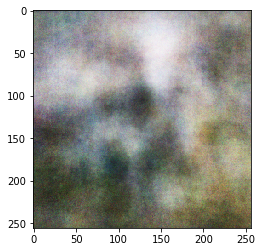

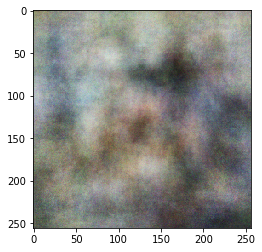

Epoch [81/175] | D Loss: 1.0579477548599243 | G Loss: 0.9679668545722961
Epoch [82/175] | D Loss: 1.5667163133621216 | G Loss: 0.8883171081542969
Epoch [83/175] | D Loss: 1.0551567077636719 | G Loss: 1.214585304260254
Epoch [84/175] | D Loss: 1.4602961540222168 | G Loss: 0.6253796219825745
Epoch [85/175] | D Loss: 1.1013609170913696 | G Loss: 0.5512762069702148
Epoch [86/175] | D Loss: 1.3256994485855103 | G Loss: 0.8453723788261414
Epoch [87/175] | D Loss: 1.5787897109985352 | G Loss: 0.6130664944648743
Epoch [88/175] | D Loss: 1.196873426437378 | G Loss: 0.671159029006958
Epoch [89/175] | D Loss: 1.5931904315948486 | G Loss: 0.5810906291007996
Epoch [90/175] | D Loss: 1.1319708824157715 | G Loss: 0.8233199715614319


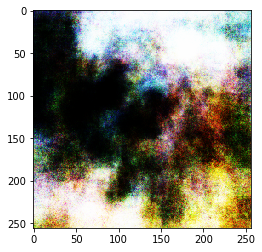

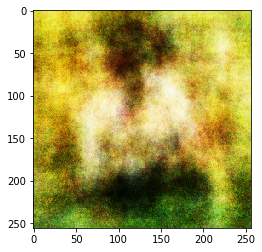

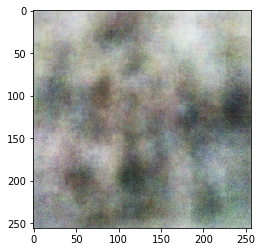

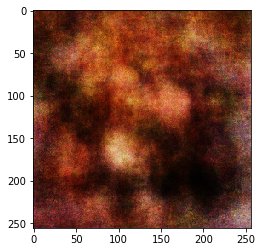

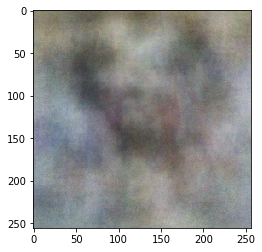

Epoch [91/175] | D Loss: 1.0714551210403442 | G Loss: 0.6053853631019592
Epoch [92/175] | D Loss: 1.0695158243179321 | G Loss: 1.0288761854171753
Epoch [93/175] | D Loss: 1.377277135848999 | G Loss: 0.9007329940795898
Epoch [94/175] | D Loss: 0.9841803312301636 | G Loss: 0.8729813694953918
Epoch [95/175] | D Loss: 1.0280495882034302 | G Loss: 0.8244450688362122
Epoch [96/175] | D Loss: 1.6250841617584229 | G Loss: 0.7982068061828613
Epoch [97/175] | D Loss: 1.350588083267212 | G Loss: 0.5871863961219788
Epoch [98/175] | D Loss: 1.252142071723938 | G Loss: 1.0857473611831665
Epoch [99/175] | D Loss: 1.1892099380493164 | G Loss: 0.7132826447486877
Epoch [100/175] | D Loss: 0.9803634881973267 | G Loss: 1.1730715036392212


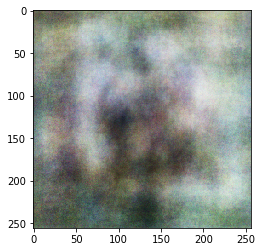

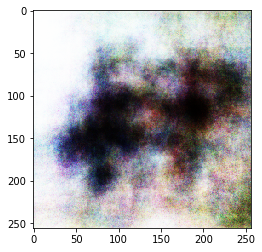

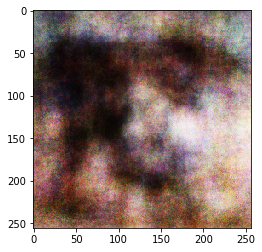

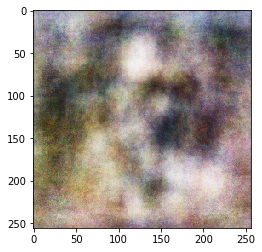

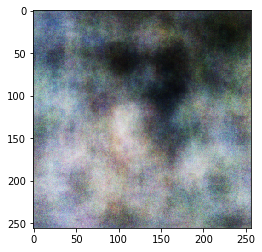

Epoch [101/175] | D Loss: 1.03769052028656 | G Loss: 1.064971923828125
Epoch [102/175] | D Loss: 1.1656039953231812 | G Loss: 0.8045932650566101
Epoch [103/175] | D Loss: 1.3409302234649658 | G Loss: 1.1512584686279297
Epoch [104/175] | D Loss: 1.692808985710144 | G Loss: 1.0529273748397827
Epoch [105/175] | D Loss: 1.9120674133300781 | G Loss: 0.6755959391593933
Epoch [106/175] | D Loss: 1.6704680919647217 | G Loss: 1.1195768117904663
Epoch [107/175] | D Loss: 1.2555785179138184 | G Loss: 0.7218777537345886
Epoch [108/175] | D Loss: 1.9604642391204834 | G Loss: 0.7069728970527649
Epoch [109/175] | D Loss: 0.9501858949661255 | G Loss: 1.3597255945205688
Epoch [110/175] | D Loss: 1.6022545099258423 | G Loss: 0.6131047010421753


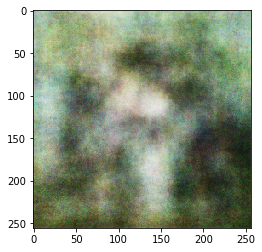

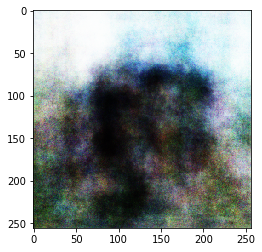

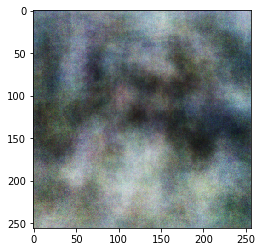

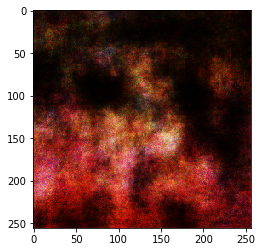

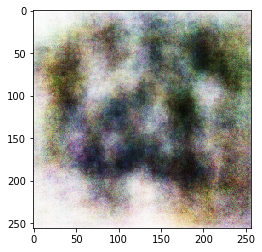

Epoch [111/175] | D Loss: 1.24051833152771 | G Loss: 1.1058098077774048
Epoch [112/175] | D Loss: 1.1386140584945679 | G Loss: 0.8431070446968079
Epoch [113/175] | D Loss: 1.3903276920318604 | G Loss: 0.7373313903808594
Epoch [114/175] | D Loss: 1.755338191986084 | G Loss: 0.36293914914131165
Epoch [115/175] | D Loss: 1.4804296493530273 | G Loss: 0.8366196155548096
Epoch [116/175] | D Loss: 1.148055076599121 | G Loss: 0.977086067199707
Epoch [117/175] | D Loss: 1.655352234840393 | G Loss: 0.5937770009040833
Epoch [118/175] | D Loss: 1.3314894437789917 | G Loss: 0.9375305771827698
Epoch [119/175] | D Loss: 1.3003745079040527 | G Loss: 0.9463176131248474
Epoch [120/175] | D Loss: 1.1664025783538818 | G Loss: 0.6805574893951416


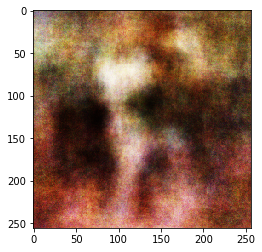

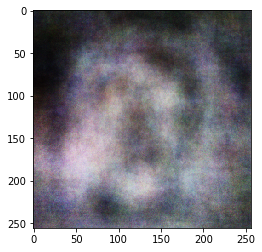

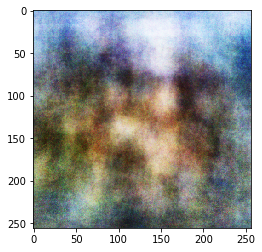

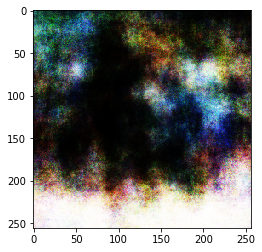

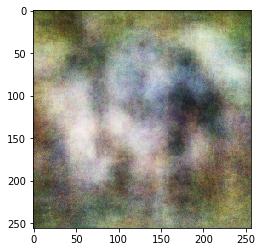

Epoch [121/175] | D Loss: 1.2962164878845215 | G Loss: 0.849208652973175
Epoch [122/175] | D Loss: 1.3050004243850708 | G Loss: 0.890431821346283
Epoch [123/175] | D Loss: 1.6814625263214111 | G Loss: 0.5341634154319763
Epoch [124/175] | D Loss: 1.2579491138458252 | G Loss: 0.6365466713905334
Epoch [125/175] | D Loss: 1.6059463024139404 | G Loss: 0.7596920132637024
Epoch [126/175] | D Loss: 1.375490427017212 | G Loss: 1.108042597770691
Epoch [127/175] | D Loss: 1.0683488845825195 | G Loss: 0.730614185333252
Epoch [128/175] | D Loss: 1.4165430068969727 | G Loss: 0.8103876113891602
Epoch [129/175] | D Loss: 1.0597797632217407 | G Loss: 0.729562520980835
Epoch [130/175] | D Loss: 1.1208832263946533 | G Loss: 0.7107531428337097


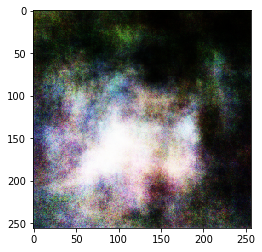

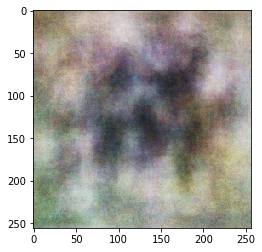

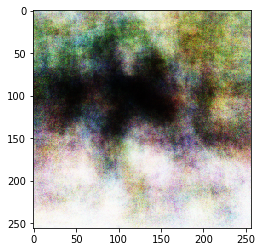

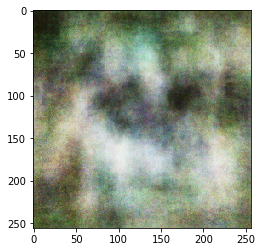

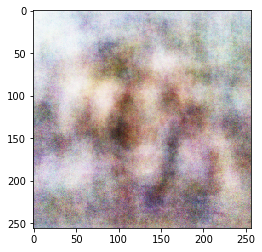

Epoch [131/175] | D Loss: 1.209916353225708 | G Loss: 0.6574805974960327
Epoch [132/175] | D Loss: 1.2957695722579956 | G Loss: 0.742149293422699
Epoch [133/175] | D Loss: 1.2334154844284058 | G Loss: 0.6693692207336426
Epoch [134/175] | D Loss: 1.4058576822280884 | G Loss: 0.6036179065704346
Epoch [135/175] | D Loss: 0.8840978145599365 | G Loss: 1.122583031654358
Epoch [136/175] | D Loss: 1.2458467483520508 | G Loss: 0.6924314498901367
Epoch [137/175] | D Loss: 1.390804648399353 | G Loss: 0.8273429274559021
Epoch [138/175] | D Loss: 1.4121240377426147 | G Loss: 0.6351627707481384
Epoch [139/175] | D Loss: 1.3512001037597656 | G Loss: 0.8946493268013
Epoch [140/175] | D Loss: 1.4083913564682007 | G Loss: 0.9675840735435486


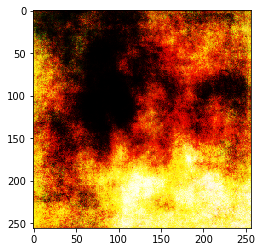

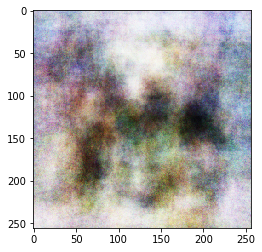

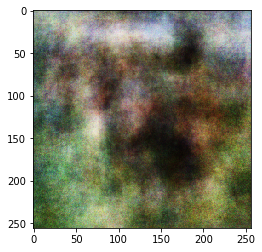

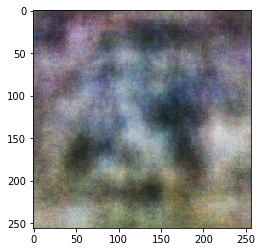

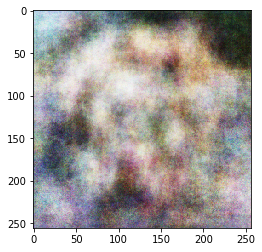

Epoch [141/175] | D Loss: 1.306222915649414 | G Loss: 0.6239471435546875
Epoch [142/175] | D Loss: 2.089200019836426 | G Loss: 0.6451341509819031
Epoch [143/175] | D Loss: 1.2786927223205566 | G Loss: 0.8211553692817688
Epoch [144/175] | D Loss: 1.7278306484222412 | G Loss: 0.7306196093559265
Epoch [145/175] | D Loss: 1.35103178024292 | G Loss: 1.2029222249984741
Epoch [146/175] | D Loss: 1.1152626276016235 | G Loss: 0.7471922039985657
Epoch [147/175] | D Loss: 1.3169910907745361 | G Loss: 0.9782565236091614
Epoch [148/175] | D Loss: 0.9585456848144531 | G Loss: 0.8331060409545898
Epoch [149/175] | D Loss: 1.4577858448028564 | G Loss: 0.6031078696250916
Epoch [150/175] | D Loss: 1.7297945022583008 | G Loss: 0.7937891483306885


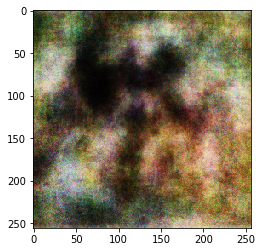

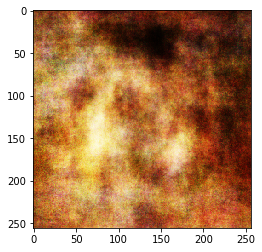

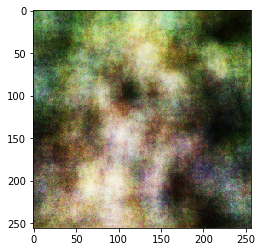

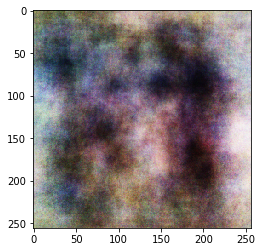

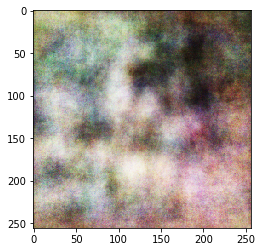

Epoch [151/175] | D Loss: 1.5480914115905762 | G Loss: 0.9248960018157959
Epoch [152/175] | D Loss: 1.4323031902313232 | G Loss: 0.9312753677368164
Epoch [153/175] | D Loss: 1.4360270500183105 | G Loss: 0.7640026211738586
Epoch [154/175] | D Loss: 1.0608092546463013 | G Loss: 0.7949936389923096
Epoch [155/175] | D Loss: 1.1166473627090454 | G Loss: 0.9870176911354065
Epoch [156/175] | D Loss: 1.1999797821044922 | G Loss: 0.6310864090919495
Epoch [157/175] | D Loss: 1.4065210819244385 | G Loss: 0.7511816620826721
Epoch [158/175] | D Loss: 1.3347079753875732 | G Loss: 0.6807178854942322
Epoch [159/175] | D Loss: 1.1976021528244019 | G Loss: 0.7769306302070618
Epoch [160/175] | D Loss: 1.1945581436157227 | G Loss: 0.7567722201347351


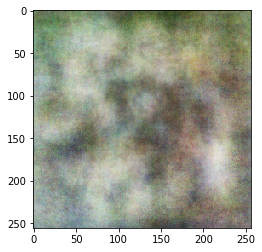

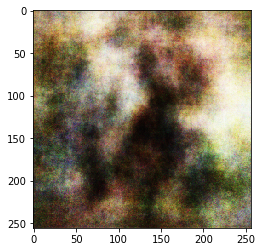

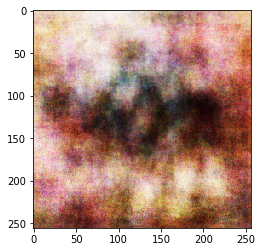

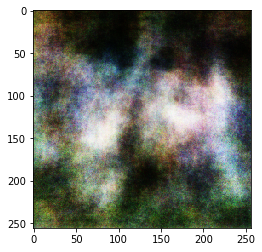

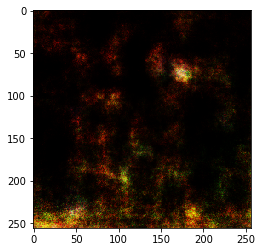

Epoch [161/175] | D Loss: 1.239464282989502 | G Loss: 0.7924320101737976
Epoch [162/175] | D Loss: 1.1542800664901733 | G Loss: 0.7635288238525391
Epoch [163/175] | D Loss: 1.3888914585113525 | G Loss: 0.7076446413993835
Epoch [164/175] | D Loss: 1.27579927444458 | G Loss: 0.6933937072753906
Epoch [165/175] | D Loss: 1.4993517398834229 | G Loss: 0.6570175290107727
Epoch [166/175] | D Loss: 1.3024077415466309 | G Loss: 0.6197433471679688
Epoch [167/175] | D Loss: 1.6465129852294922 | G Loss: 0.8938260078430176
Epoch [168/175] | D Loss: 1.8365538120269775 | G Loss: 0.5695827007293701
Epoch [169/175] | D Loss: 1.27382230758667 | G Loss: 0.6009514927864075
Epoch [170/175] | D Loss: 1.3963738679885864 | G Loss: 0.6964381337165833


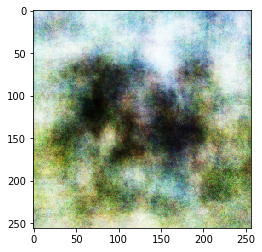

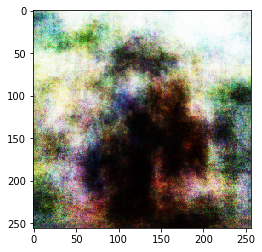

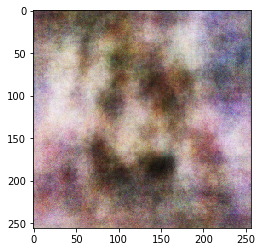

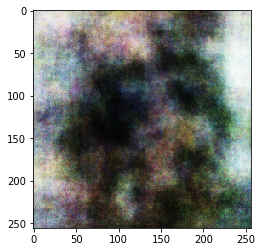

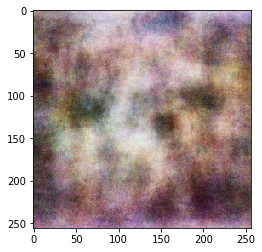

Epoch [171/175] | D Loss: 1.3568799495697021 | G Loss: 0.7720489501953125
Epoch [172/175] | D Loss: 1.1629570722579956 | G Loss: 0.7916128635406494
Epoch [173/175] | D Loss: 1.6191880702972412 | G Loss: 0.7757620811462402
Epoch [174/175] | D Loss: 1.4450587034225464 | G Loss: 0.7022013664245605


In [8]:
num_epochs = 175
for epoch in range(num_epochs):
    for imgs, _ in dataloader:
        imgs = imgs.to(device)

        # Train Discriminator
        optimizer_D.zero_grad()

        real_labels = torch.ones(imgs.size(0), 1).to(device)
        fake_labels = torch.zeros(imgs.size(0), 1).to(device)

        real_loss = adversarial_loss(discriminator(imgs), real_labels)

        z = torch.randn(imgs.size(0), latent_dim).to(device)
        generated_imgs = generator(z)

        fake_loss = adversarial_loss(discriminator(generated_imgs.detach()), fake_labels)
        d_loss = real_loss + fake_loss
        d_loss.backward()
        optimizer_D.step()
        torch.cuda.empty_cache()

        # Train Generator
        optimizer_G.zero_grad()

        g_loss = adversarial_loss(discriminator(generated_imgs), real_labels)
        g_loss.backward()
        optimizer_G.step()
        torch.cuda.empty_cache()


    print(f"Epoch [{epoch}/{num_epochs}] | D Loss: {d_loss.item()} | G Loss: {g_loss.item()}")

    if epoch % 10 == 0:
        with torch.no_grad():
            z = torch.randn(16, latent_dim).to(device)
            generated_imgs = generator(z)
            torch.cuda.empty_cache()
            generated_imgs = generated_imgs.cpu().numpy().transpose(0, 2, 3, 1)
            for i in range(5):
                plt.imshow((generated_imgs[i] + 1) / 2)
                plt.show()


In [9]:
torch.save(generator.state_dict(), 'generator.pth')
torch.save(discriminator.state_dict(), 'discriminator.pth')


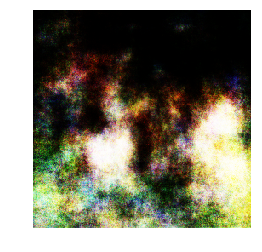

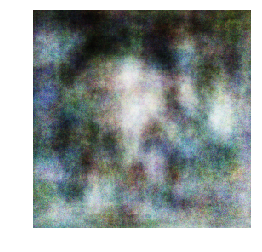

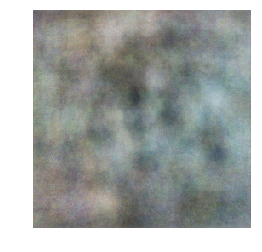

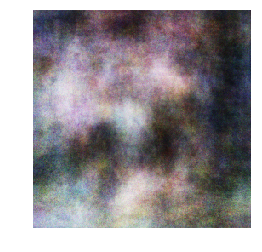

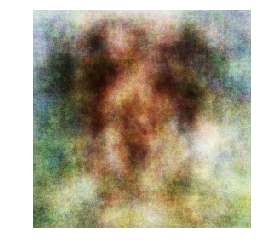

In [10]:
latent_dim = 100  # Should match the latent_dim used during training

generator = Generator(latent_dim).to(device)
generator.load_state_dict(torch.load('generator.pth'))
generator.eval()  # Set the generator to evaluation mode

# Number of images to generate
num_images = 5

# Generate random noise
z = torch.randn(num_images, latent_dim).to(device)
with torch.no_grad():  # No need to calculate gradients for prediction
    generated_imgs = generator(z)
    generated_imgs = generated_imgs.cpu().numpy().transpose(0, 2, 3, 1)

for i in range(num_images):
    img = (generated_imgs[i] + 1) / 2  # Rescale to [0, 1] range from [-1, 1]
    plt.imshow(img)
    plt.axis('off')
    plt.show()


## Conclusion

With a better GPU and better samples of the photos of the dogs fed into my model, we could perhaps get a better generator for the dogs. However, you can still see from regular noise, visages of dogs are being generated. I think the biggest thing holding me back is actually the GPU constraints and time.